This notebook compares StereoMapper dervied mappings with those generated by the BridgeDB database, on the set of ChEBI identifiers used in benchmarking (n=190,715), mapped to the HMDB database. Due to the differences in how the two methods work, the inputs will first be attempted to be mapped to HMDB by BridgeDB to produce a set of mappings. The set of positive mappings will be extracted, and as StereoMapper requires molfiles as input, these positive mappings will be used to fetch the molfiles the molfiles for HMDB. This will allow for the comparison of BridgeDB and StereoMapper mappings. 

In [96]:
import os
import re
import time
import requests
import json
import itertools
import shutil
import numpy as np
import matplotlib.pyplot as plt
import subprocess
import sqlite3
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from urllib.parse import quote
from io import StringIO
from helper_functions import normalise_chebi_id, normalise_hmdb_id, get_hmdb_from_chebi, get_hmdb_from_chebi_batch
from viz_structures import structure_to_publication_svg

In [2]:
# define constants
BASE_URL = "https://webservice.bridgedb.org"
ORG = "Human"
SOURCE = "Ce"  # ChEBI


In [3]:
# provide path to chebi molfiles used in benchmarking (this can be downloaded from the following zenodo record: https://doi.org/10.5281/zenodo.17831412 - file name stereomapper_structures.tar.gz)
chebi_strucs_path = Path.home() / 'Downloads' / 'stereomapper_structures' / 'molDistance_structures' / 'chebi_structures' # contains all chebi molfiles used in benchmarking
# validate it contains the expected files
assert (chebi_strucs_path / 'CHEBI_126.sdf').exists(), "Expected file CHEBI_126.sdf not found in chebi_strucs_path."

In [4]:
# extract chebi ids from molfile names, and save to a dataframe
chebi_ids = []
for molfile in chebi_strucs_path.glob("*.sdf"):
    match = re.match(r"CHEBI_(\d+)\.sdf", molfile.name)
    if match:
        chebi_ids.append(f"CHEBI:{match.group(1)}")

# save to dataframe
chebi_df = pd.DataFrame({"chebi_id": chebi_ids})

In [5]:
chebi_df

,chebi_id
0,CHEBI:147801
1,CHEBI:214098
2,CHEBI:72534
3,CHEBI:126256
4,CHEBI:175270
...,...
190710,CHEBI:181596
190711,CHEBI:214804
190712,CHEBI:138937
190713,CHEBI:123498


In [6]:
# test function to get hmdb id from chebi id for a single id
get_hmdb_from_chebi("CHEBI:16449")

Fetching HMDB mapping for CHEBI:16449 from BridgeDb...


,chebi_id,hmdb_id
0,CHEBI:16449,HMDB0062251


In [9]:
mappings_df, no_mapping_df, failed_df = get_hmdb_from_chebi_batch(
    chebi_df["chebi_id"].tolist(),
    sleep_s=0.1,
    timeout=30,
    progress_every=500,
)

mappings_df.to_csv("bridgedb_chebi_to_hmdb.csv", index=False)
no_mapping_df.to_csv("bridgedb_chebi_no_hmdb_mapping.csv", index=False)
failed_df.to_csv("bridgedb_chebi_failed.csv", index=False)

print(f"Input ChEBI IDs: {chebi_df['chebi_id'].nunique():,}")
print(f"Mapped ChEBI IDs: {mappings_df['chebi_id'].nunique():,}")
print(f"Unique ChEBI-HMDB pairs: {len(mappings_df):,}")
print(f"No HMDB mapping: {len(no_mapping_df):,}")
print(f"Failed queries: {len(failed_df):,}")

Fetching HMDB mapping for CHEBI:10 from BridgeDb...
Fetching HMDB mapping for CHEBI:100 from BridgeDb...
Fetching HMDB mapping for CHEBI:10000 from BridgeDb...
Fetching HMDB mapping for CHEBI:100000 from BridgeDb...
Fetching HMDB mapping for CHEBI:100001 from BridgeDb...
Fetching HMDB mapping for CHEBI:100002 from BridgeDb...
Fetching HMDB mapping for CHEBI:100003 from BridgeDb...
Fetching HMDB mapping for CHEBI:100004 from BridgeDb...
Fetching HMDB mapping for CHEBI:100005 from BridgeDb...
Fetching HMDB mapping for CHEBI:100006 from BridgeDb...
Fetching HMDB mapping for CHEBI:100007 from BridgeDb...
Fetching HMDB mapping for CHEBI:100008 from BridgeDb...
Fetching HMDB mapping for CHEBI:100009 from BridgeDb...
Fetching HMDB mapping for CHEBI:10001 from BridgeDb...
Fetching HMDB mapping for CHEBI:100010 from BridgeDb...
Fetching HMDB mapping for CHEBI:100011 from BridgeDb...
Fetching HMDB mapping for CHEBI:100012 from BridgeDb...
Fetching HMDB mapping for CHEBI:100013 from BridgeDb...
F

Molfiles required from hmdb can be searched for in the hmdb_structures folder of the stereomapper_structures downloaded from zenodo. From here, we need to filter down to the mappings which we have molfiles for both the chebi and the hmdb, so that an accurate comparison can be made between StereoMapper and BridgeDB.

In [6]:
# path to hmdb structures
hmdb_structures = Path.home() / 'Downloads' / 'stereomapper_structures' / 'molDistance_structures' / 'hmdb_structures' # contains all hmdb molfiles used in benchmarking

In [29]:
# load the csv of valid mappings
mappings_df = pd.read_csv("bridgedb_chebi_to_hmdb.csv")
mappings_df.head()

,chebi_id,hmdb_id
0,CHEBI:10002,HMDB0259840
1,CHEBI:100147,HMDB0014917
2,CHEBI:10022,HMDB0036156
3,CHEBI:10023,HMDB0014720
4,CHEBI:100241,HMDB0014677


In [30]:
# fileter mappings_df to only include mappings where the hmdb id is in the hmdb_structures directory and
# the chebi id is in the chebi_strucs_path directory (i.e. only include mappings where we have structures for both the chebi and hmdb ids)
valid_mappings_df = mappings_df[
    mappings_df["hmdb_id"].apply(lambda x: (hmdb_structures / f"{x}.sdf").exists()) &
    mappings_df["chebi_id"].apply(lambda x: (chebi_strucs_path / f"{x.replace('CHEBI:', 'CHEBI_')}.sdf").exists())
]   

print(f"Valid ChEBI-HMDB pairs with structures: {len(valid_mappings_df):,}")

Valid ChEBI-HMDB pairs with structures: 14,487


In [26]:
# create a pairkey column in valid_mappings_df for easier comparison later
valid_mappings_df["pairkey"] = valid_mappings_df.apply(lambda row: f"{row['chebi_id']}|{row['hmdb_id']}", axis=1)
valid_mappings_df.head()

,chebi_id,hmdb_id,chebi_molfile,hmdb_molfile,pairkey
0,CHEBI:10002,HMDB0259840,/home/jackmcgoldrick/Downloads/stereomapper_st...,/home/jackmcgoldrick/Downloads/stereomapper_st...,CHEBI:10002|HMDB0259840
1,CHEBI:100147,HMDB0014917,/home/jackmcgoldrick/Downloads/stereomapper_st...,/home/jackmcgoldrick/Downloads/stereomapper_st...,CHEBI:100147|HMDB0014917
2,CHEBI:10022,HMDB0036156,/home/jackmcgoldrick/Downloads/stereomapper_st...,/home/jackmcgoldrick/Downloads/stereomapper_st...,CHEBI:10022|HMDB0036156
3,CHEBI:10023,HMDB0014720,/home/jackmcgoldrick/Downloads/stereomapper_st...,/home/jackmcgoldrick/Downloads/stereomapper_st...,CHEBI:10023|HMDB0014720
4,CHEBI:100241,HMDB0014677,/home/jackmcgoldrick/Downloads/stereomapper_st...,/home/jackmcgoldrick/Downloads/stereomapper_st...,CHEBI:100241|HMDB0014677


In [8]:
valid_molfiles_dir = Path.home() / 'repos' / 'stereomapper_original_release' / 'data' / 'bridgedb_valid_molfiles'
valid_molfiles_dir.mkdir(parents=True, exist_ok=True)

for _, row in valid_mappings_df.iterrows():
    chebi_src = Path(row["chebi_molfile"])
    hmdb_src = Path(row["hmdb_molfile"])
    chebi_dest = valid_molfiles_dir / f"{row['chebi_id'].replace('CHEBI:', 'CHEBI_')}.sdf"
    hmdb_dest = valid_molfiles_dir / f"{row['hmdb_id']}.sdf"

    # Chebi
    try:
        if not chebi_dest.exists():
            chebi_dest.symlink_to(chebi_src)
        else:
            # if existing link/file points elsewhere, replace it
            try:
                if not chebi_dest.samefile(chebi_src):
                    chebi_dest.unlink()
                    chebi_dest.symlink_to(chebi_src)
            except (OSError, FileNotFoundError):
                chebi_dest.unlink()
                chebi_dest.symlink_to(chebi_src)
    except OSError:
        if not chebi_dest.exists():
            shutil.copy2(chebi_src, chebi_dest)

    # HMDB (same logic)
    try:
        if not hmdb_dest.exists():
            hmdb_dest.symlink_to(hmdb_src)
        else:
            try:
                if not hmdb_dest.samefile(hmdb_src):
                    hmdb_dest.unlink()
                    hmdb_dest.symlink_to(hmdb_src)
            except (OSError, FileNotFoundError):
                hmdb_dest.unlink()
                hmdb_dest.symlink_to(hmdb_src)
    except OSError:
        if not hmdb_dest.exists():
            shutil.copy2(hmdb_src, hmdb_dest)

NameError: name 'valid_mappings_df' is not defined

## Run StereoMapper on the mappings from BridgeDB
Now that we have all the molfiles for the set of valid (mappings which have structures) mappings, we can pass them to StereoMapper and evaluate the performance between the two frameworks for cross-mapping.

In [9]:
molfile_dir = Path.home()  / 'repos' / 'stereomapper_original_release' / 'data' / 'bridgedb_valid_molfiles'
results_full_file = Path.home() / 'repos' /'stereomapper' / 'results' / 'stereomapper_vs_bridgedb_comparison.sqlite'

In [ ]:
cmd =[
    "stereomapper",
    "run",
    "-d", molfile_dir.as_posix(),
    "-o", results_full_file.as_posix(),
    "--fresh-cache"
]

subprocess.run(cmd) 

INFO    Logging initialised. File: logs/stereomapper_20260608_091556.log
Pipeline: 100%|██████████████████████████████████████████████████████████| , Complete! [02:58<00:00]


✅ Pipeline completed in 178.1s
📦 Inputs attempted: 28,383 (skipped 0)
📊 Successes: 28,377 | Failures: 6
🔗 Inchikey groups — processed 13,460, skipped 0, failed 0
🧮 Relationship rows: 2,519
🧾 Unique inchikeys observed: 13,460
💾 Cache hit rate: 0.0%


Pipeline: 100%|██████████████████████████████████████████████████████████| , Complete! [02:58<00:00]


CompletedProcess(args=['stereomapper', 'run', '-d', '/home/jackmcgoldrick/repos/stereomapper_original_release/data/bridgedb_valid_molfiles', '-o', '/home/jackmcgoldrick/repos/stereomapper/results/stereomapper_vs_bridgedb_comparison.sqlite', '--fresh-cache'], returncode=0)

In [17]:
# query the output db into pandas df
with sqlite3.connect(results_full_file) as conn:
    clusters_df = pd.read_sql_query("SELECT * FROM clusters", conn)
    relationships_df = pd.read_sql_query("SELECT * FROM relationships", conn)

# close conn
conn.close()

In [18]:
print(f"Clusters found: {len(clusters_df):,}")
print(f"Relationships found: {len(relationships_df):,}")

Clusters found: 15,367
Relationships found: 2,519


More clusters found by StereoMapper than compared to BridgeDB (14,487) on this set of inputs. This could be due to StereoMapper splitting some of BridgeDB's mappings out into more specified distinct clusters, or even the identification of within database duplicates causing an inflation of identified mappings. Either one of these is possible, and both are likely to occur. A final possibility is that StereoMapper found no mapping at all for a given BridgeDB mapping, leaving the metabolites in single clusters, contributing to inflated numbers of mappings.

To negate the influence of the latter, mappings which contain either (i) a ChEBI identifier on both sides, and no HMDB at all, or (ii) a HMDB identifier on both sides, and ChEBI will be removed, to negate the influence of duplicate identification within a single database.

In [19]:
clusters_df

,cluster_id,inchikey_first,identity_key_strict,is_undef_sru,is_def_sru,sru_repeat_count,sru_key,member_count,members_json,members_hash
0,1,AAAFZMYJJHWUPN,O=P(O)(O)OC[C@H]1O[C@H](OP(=O)(O)O)[C@H](O)[C@...,0,0,NaN,none,2,"[""chebi:68819"", ""hmdb:HMDB0011688""]",74b30f84f4350caa6ccf01ac34c5228946418c308020e7...
1,2,AAAQKTZKLRYKHR,c1ccc(C(c2ccccc2)c2ccccc2)cc1,0,0,NaN,none,2,"[""chebi:76212"", ""hmdb:HMDB0259264""]",cd6c9dec03264953a8f7f9476d378549db7aae4159676d...
2,3,AABTWRKUKUPMJG,Cc1coc(C)c1,0,0,NaN,none,2,"[""chebi:89526"", ""hmdb:HMDB0032965""]",4815467fedc22985212fe84b40ca4de083f4034ffcee0b...
3,4,AADLTHQNYQJHQV,CCCCCCCCCCCCC/C=C/[C@@H](O)[C@H](COP(=O)([O-])...,0,0,NaN,none,2,"[""chebi:83359"", ""hmdb:HMDB0012102""]",c4c686ed0a12d35c89d1b0178594afe81f714891cd0d03...
4,5,AADQFNAACHHRLT,Cc1ccc(C(C)C)c(C)c1,0,0,NaN,none,2,"[""chebi:88567"", ""hmdb:HMDB0061810""]",5077be714e535eb4fe4ec6db405031a9a6bdd72ba361a8...
...,...,...,...,...,...,...,...,...,...,...
15362,15363,ZZVUWRFHKOJYTH,CN(C)CCOC(c1ccccc1)c1ccccc1,0,0,NaN,none,2,"[""chebi:4636"", ""hmdb:HMDB0001927""]",cae25433a7703b146e3c3870728fa687611d7256c66dae...
15363,15364,ZZWPMFROUHHAKY,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2O[C@@H]2O[C@H](...,0,0,NaN,none,2,"[""chebi:74793"", ""hmdb:HMDB0013689""]",8dbaf84e40a14f84f5b14d6fc2de3c9e695edc41f3c05b...
15364,15365,ZZYSLNWGKKDOML,CCc1nn(C)c(C(=O)NCc2ccc(C(C)(C)C)cc2)c1Cl,0,0,NaN,none,2,"[""chebi:9422"", ""hmdb:HMDB0258765""]",639c73ea69be4ecaac8f47f2de2bf8a7184de7a7395236...
15365,15366,ZZZGESKVVWXPMW,[SeH4+2],0,0,NaN,none,1,"[""hmdb:HMDB0001349""]",abcfeef2fa21c511c5d867f75fec4483c9a829e28c9f6c...


In [20]:
# parse members_json column to get cluster_abbrvs column (list of chebi and hmdb ids in each cluster)
clusters_df["cluster_abbrvs"] = clusters_df["members_json"].apply(json.loads)

# explode clusters to get one row per cluster member
cluster_members_df = (
    clusters_df[["cluster_id", "cluster_abbrvs"]]
    .explode("cluster_abbrvs")
    .rename(columns={"cluster_abbrvs": "identifier"})
    .dropna(subset=["identifier"])
)

cluster_members_df

,cluster_id,identifier
0,1,chebi:68819
0,1,hmdb:HMDB0011688
1,2,chebi:76212
1,2,hmdb:HMDB0259264
2,3,chebi:89526
...,...,...
15364,15365,chebi:9422
15364,15365,hmdb:HMDB0258765
15365,15366,hmdb:HMDB0001349
15366,15367,chebi:8342


In [21]:
clusters_df["n_chebi"] = clusters_df["cluster_abbrvs"].apply(
    lambda xs: sum(x.startswith("chebi:") for x in xs)
)

clusters_df["n_hmdb"] = clusters_df["cluster_abbrvs"].apply(
    lambda xs: sum(x.startswith("hmdb:") for x in xs)
)

clusters_df[["n_chebi", "n_hmdb"]].value_counts().sort_index()

n_chebi  n_hmdb
0        1          1192
1        0          1213
         1         12920
2        0             1
         1            41
Name: count, dtype: int64

In [22]:
# normalise identifiers in cluster_members_df to match the format in valid_mappings_df (i.e. CHEBI:xxxx and HMDBxxxx)
def normalise_identifier(identifier):
    if identifier.startswith("chebi:"):
        return normalise_chebi_id(identifier)
    elif identifier.startswith("hmdb:"):
        # remove the hmdb: prefix from the identifier, the rest is okay
        return normalise_hmdb_id(identifier.replace("hmdb:", ""))
    else:
        return identifier
    
cluster_members_df["identifier"] = cluster_members_df["identifier"].apply(normalise_identifier)
cluster_members_df.head()

,cluster_id,identifier
0,1,CHEBI:68819
0,1,HMDB0011688
1,2,CHEBI:76212
1,2,HMDB0259264
2,3,CHEBI:89526


In [23]:
# determine if there are any dups, shouldn't be
duplicate_ids = (
    cluster_members_df
    .groupby("identifier")["cluster_id"]
    .nunique()
    .reset_index(name="n_clusters")
    .query("n_clusters > 1")
)

duplicate_ids

,identifier,n_clusters


No duplicates found, we can continue to downstream analysis.

In [40]:
# build a look-up table of identifier to cluster_id
id_to_cluster = cluster_members_df[["identifier", "cluster_id"]].drop_duplicates()

In [41]:
id_to_cluster.head()

,identifier,cluster_id
0,CHEBI:68819,1
0,HMDB0011688,1
1,CHEBI:76212,2
1,HMDB0259264,2
2,CHEBI:89526,3


In [42]:
# merge based on chebis
annotated_df = valid_mappings_df.merge(
    id_to_cluster.rename(columns={
        "identifier": "chebi_id",
        "cluster_id": "chebi_cluster_id"
    }),
    on="chebi_id",
    how="left"
)

In [43]:
# now merge hmdbs onto the annotated_df containing the chebi cluster ids
annotated_df = annotated_df.merge(
    id_to_cluster.rename(columns={
        "identifier": "hmdb_id",
        "cluster_id": "hmdb_cluster_id"
    }),
    on="hmdb_id",
    how="left"
)

In [44]:
annotated_df

,chebi_id,hmdb_id,chebi_cluster_id,hmdb_cluster_id
0,CHEBI:10002,HMDB0259840,8222.0,8222.0
1,CHEBI:100147,HMDB0014917,7206.0,7206.0
2,CHEBI:10022,HMDB0036156,6588.0,6587.0
3,CHEBI:10023,HMDB0014720,693.0,693.0
4,CHEBI:100241,HMDB0014677,7611.0,7611.0
...,...,...,...,...
14482,CHEBI:9927,HMDB0014323,63.0,63.0
14483,CHEBI:9939,HMDB0015432,812.0,812.0
14484,CHEBI:9943,HMDB0005016,9270.0,9270.0
14485,CHEBI:995,HMDB0001330,5781.0,5781.0


In [45]:
def classify_mapping(row):
    chebi_present = pd.notna(row["chebi_cluster_id"])
    hmdb_present = pd.notna(row["hmdb_cluster_id"])

    if chebi_present and hmdb_present:
        if row["chebi_cluster_id"] == row["hmdb_cluster_id"]:
            return "agreement_same_cluster"
        return "disagreement_different_clusters"

    if chebi_present and not hmdb_present:
        return "not_assessable_hmdb_missing"

    if not chebi_present and hmdb_present:
        return "not_assessable_chebi_missing"

    return "not_assessable_both_missing"


annotated_df["comparison_outcome"] = annotated_df.apply(classify_mapping, axis=1)

In [46]:
annotated_df["comparison_outcome"].value_counts()

comparison_outcome
agreement_same_cluster             12997
disagreement_different_clusters     1458
not_assessable_chebi_missing          23
not_assessable_hmdb_missing            6
not_assessable_both_missing            3
Name: count, dtype: int64

Agreement noted for the most part, only 1458 are deemed to be in disagreement. We need to determine how many BridgeDB mappings were rejected by StereoMapper because our method thought the mappings were distinct and split. Then we can determine the relationships which cause this.

In [47]:
cluster_sizes = (
    cluster_members_df
    .groupby("cluster_id")
    .size()
    .reset_index(name="cluster_size")
)

annotated_df = annotated_df.merge(
    cluster_sizes.rename(columns={
        "cluster_id": "chebi_cluster_id",
        "cluster_size": "chebi_cluster_size"
    }),
    on="chebi_cluster_id",
    how="left"
)

annotated_df = annotated_df.merge(
    cluster_sizes.rename(columns={
        "cluster_id": "hmdb_cluster_id",
        "cluster_size": "hmdb_cluster_size"
    }),
    on="hmdb_cluster_id",
    how="left"
)

In [48]:
disagreement_df = annotated_df[
    annotated_df["comparison_outcome"] == "disagreement_different_clusters"
]

disagreement_df[[
    "chebi_cluster_size",
    "hmdb_cluster_size"
]].value_counts().sort_index()

chebi_cluster_size  hmdb_cluster_size
1.0                 1.0                  1025
                    2.0                   192
2.0                 1.0                   179
                    2.0                    56
3.0                 1.0                     4
                    2.0                     2
Name: count, dtype: int64

Could do with an example or two of disagreements? Or trying to categorise them in a similar manner to the approach that was used for MNX comparison. Probably most reliable to do a similar type of analysis to avoid apparent bias in results. 

In [49]:
# determine agreement vs disagreement proportions between stereomapper and bridgedb
agreement_counts = annotated_df["comparison_outcome"].value_counts()
agreement_proportions = agreement_counts / len(annotated_df)
agreement_proportions

comparison_outcome
agreement_same_cluster             0.897149
disagreement_different_clusters    0.100642
not_assessable_chebi_missing       0.001588
not_assessable_hmdb_missing        0.000414
not_assessable_both_missing        0.000207
Name: count, dtype: float64

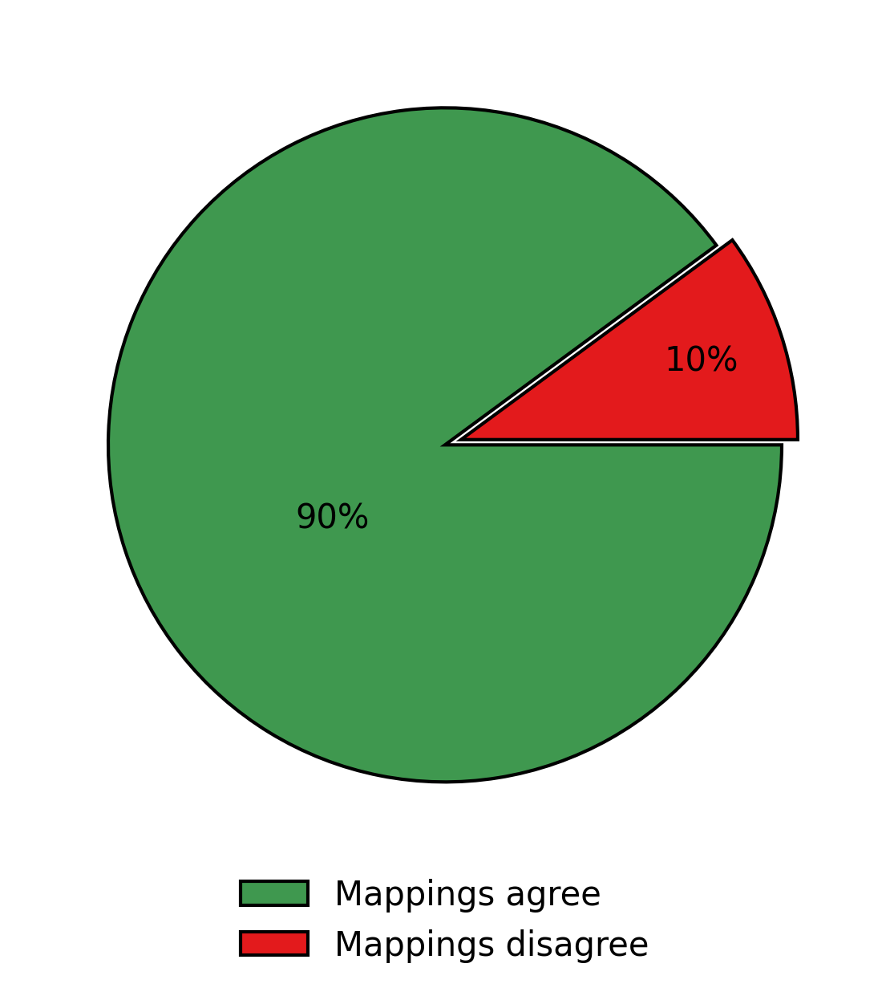

Percentages over all mappings:
Mappings agree: 89.7%
Mappings disagree: 10.1%
Non-assessable: 0.2%

Non-assessable mappings: 0.2%


In [73]:
# ------------------------
# Build summary in panel A style
# ------------------------

rename_map = {
    "agreement_same_cluster": "Mappings agree",
    "disagreement_different_clusters": "Mappings disagree",
    "not_assessable_chebi_missing": "Non-assessable",
    "not_assessable_hmdb_missing": "Non-assessable",
    "not_assessable_both_missing": "Non-assessable",
}

# Raw counts from annotated_df
raw_counts = (
    annotated_df["comparison_outcome"]
    .dropna()
    .astype(str)
    .str.strip()
    .value_counts()
    .to_dict()
)

# Collapse categories according to rename_map
counts_all = {}
for old_label, count in raw_counts.items():
    if old_label in rename_map:
        new_label = rename_map[old_label]
        counts_all[new_label] = counts_all.get(new_label, 0) + count

# Percentages over all mappings
total_all = sum(counts_all.values())
percentages_all = {
    k: (v / total_all) * 100
    for k, v in counts_all.items()
}

# Only show assessable cases in the pie
include_labels = [
    "Mappings agree",
    "Mappings disagree",
]

counts = {k: counts_all[k] for k in include_labels if k in counts_all}

# Re-normalise for displayed pie only
total_plot = sum(counts.values())
percentages = {
    k: (v / total_plot) * 100
    for k, v in counts.items()
}

# Rounded wedge labels
display_percentages = {
    k: round(v)
    for k, v in percentages.items()
}

# For caption/reporting
non_assessable_pct = percentages_all.get("Non-assessable", 0)

# ------------------------
# Plot styling
# ------------------------

colour_map = {
    "Mappings agree": "#3f984f",      # exact match to panel A green
    "Mappings disagree": "#e31a1c",   # exact match to panel A red
}

labels = list(counts.keys())
sizes = np.array(list(counts.values()), dtype=float)
colours = [colour_map[cat] for cat in labels]

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "font.size": 12,
    "figure.dpi": 300,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

fig, ax = plt.subplots(figsize=(5, 5))

explode = [0.0, 0.05] if len(labels) == 2 else [0.0] * len(labels)

wedges, texts, autotexts = ax.pie(
    sizes,
    explode=explode,
    colors=colours,
    startangle=0,          # exact match to panel A
    counterclock=False,    # exact match to panel A
    autopct=lambda pct: "",
    pctdistance=0.75,
    wedgeprops=dict(edgecolor="black", linewidth=1.0),
    textprops=dict(fontsize=10),
)

# Manually set rounded percentage labels
for lbl, autotext in zip(labels, autotexts):
    autotext.set_text(f"{display_percentages[lbl]}%")
    autotext.set_fontsize(10)

# Reposition the "Mappings agree" label similarly to panel A
if "Mappings agree" in labels:
    idx_agree = labels.index("Mappings agree")
    w_agree = wedges[idx_agree]
    t_agree = autotexts[idx_agree]

    theta_mid = 0.5 * (w_agree.theta1 + w_agree.theta2)
    theta_mid += 15
    r = 0.4

    x = r * np.cos(np.deg2rad(theta_mid))
    y = r * np.sin(np.deg2rad(theta_mid))

    t_agree.set_position((x, y))
    t_agree.set_ha("center")
    t_agree.set_va("center")

ax.set_aspect("equal")

ax.legend(
    wedges,
    labels,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.15),
    ncol=1,
    frameon=False,
    fontsize=10,
)

plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.25)

plt.show()

# save if needed
outbase = Path.home() / 'stereomapper_revision' / 'v5' / 'graphics' / 'bridgedb_res' / 'panelA'
fig.savefig(outbase.with_suffix('.pdf'), bbox_inches='tight')
fig.savefig(outbase.with_suffix('.svg'), bbox_inches='tight')

# Optional reporting for caption
print("Percentages over all mappings:")
for k, v in percentages_all.items():
    print(f"{k}: {v:.1f}%")

print(f"\nNon-assessable mappings: {non_assessable_pct:.1f}%")

## Map relationships onto disagreements to identify reasons for disagreement. 


In [50]:
relationships_df

,cluster_a,cluster_b,cluster_a_members,cluster_b_members,cluster_a_size,cluster_b_size,classification,score,score_details,extra_info,version_tag
0,26,27,"[""chebi:89840""]","[""hmdb:HMDB0005397""]",1,1,Enantiomers,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
1,31,32,"[""chebi:88735""]","[""hmdb:HMDB0010343""]",1,1,Stereo-resolution pairs,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
2,60,61,"[""hmdb:HMDB0001885""]","[""chebi:53678""]",1,1,Stereo-resolution pairs,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
3,62,63,"[""chebi:94331"", ""hmdb:HMDB0242150""]","[""chebi:9927"", ""hmdb:HMDB0014323""]",2,2,Stereo-resolution pairs,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
4,75,76,"[""hmdb:HMDB0028972""]","[""chebi:74702""]",1,1,Stereo-resolution pairs,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
...,...,...,...,...,...,...,...,...,...,...,...
2514,15323,15324,"[""chebi:169487"", ""hmdb:HMDB0037651""]","[""chebi:75664"", ""hmdb:HMDB0304728""]",2,2,Stereo-resolution pairs,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
2515,15323,15325,"[""chebi:169487"", ""hmdb:HMDB0037651""]","[""chebi:75666"", ""hmdb:HMDB0037653""]",2,2,Stereo-resolution pairs,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
2516,15324,15325,"[""chebi:75664"", ""hmdb:HMDB0304728""]","[""chebi:75666"", ""hmdb:HMDB0037653""]",2,2,Diastereomers,100.0,"{""confidence_bin"":""high""}",NaN,v1.0
2517,15337,15338,"[""hmdb:HMDB0028979""]","[""chebi:74707""]",1,1,Stereo-resolution pairs,79.0,"{""confidence_bin"":""medium""}",NaN,v1.0


In [51]:
# keep only BridgeDB mappings where both IDs were present,
# but StereoMapper put them in different clusters
disagreement_df = annotated_df[
    annotated_df["comparison_outcome"] == "disagreement_different_clusters"
].copy()

In [55]:
disagreement_df

,chebi_id,hmdb_id,chebi_cluster_id,hmdb_cluster_id,comparison_outcome,chebi_cluster_size,hmdb_cluster_size,cluster_pair_key,cluster_a,cluster_b,cluster_a_members,cluster_b_members,classification
0,CHEBI:10022,HMDB0036156,6588.0,6587.0,disagreement_different_clusters,1.0,1.0,"(6587, 6588)",6587.0,6588.0,"[""hmdb:HMDB0036156""]","[""chebi:10022""]",Stereo-resolution pairs
1,CHEBI:100417,HMDB0012488,14264.0,1414.0,disagreement_different_clusters,1.0,1.0,"(1414, 14264)",NaN,NaN,NaN,NaN,NaN
2,CHEBI:10057,HMDB0029923,3426.0,5840.0,disagreement_different_clusters,1.0,1.0,"(3426, 5840)",NaN,NaN,NaN,NaN,NaN
3,CHEBI:101009,HMDB0015508,14965.0,4715.0,disagreement_different_clusters,1.0,1.0,"(4715, 14965)",NaN,NaN,NaN,NaN,NaN
4,CHEBI:101202,HMDB0014767,6110.0,12896.0,disagreement_different_clusters,1.0,1.0,"(6110, 12896)",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,CHEBI:9642,HMDB0032462,7421.0,14613.0,disagreement_different_clusters,1.0,1.0,"(7421, 14613)",NaN,NaN,NaN,NaN,NaN
1454,CHEBI:9763,HMDB0014823,13356.0,13355.0,disagreement_different_clusters,1.0,1.0,"(13355, 13356)",13355.0,13356.0,"[""hmdb:HMDB0014823""]","[""chebi:9763""]",Stereo-resolution pairs
1455,CHEBI:9859,HMDB0033748,6700.0,6699.0,disagreement_different_clusters,1.0,1.0,"(6699, 6700)",6699.0,6700.0,"[""hmdb:HMDB0033748""]","[""chebi:9859""]",Stereo-resolution pairs
1456,CHEBI:99,HMDB0036629,4326.0,4325.0,disagreement_different_clusters,1.0,1.0,"(4325, 4326)",4325.0,4326.0,"[""hmdb:HMDB0036629""]","[""chebi:99""]",Stereo-resolution pairs


In [52]:
# create function for pairkey gen
def make_cluster_pair_key(a, b):
    if pd.isna(a) or pd.isna(b):
        return None

    a = int(a)
    b = int(b)

    return tuple(sorted([a, b]))

# create cluster_pair_key columns in both dfs for merging
disagreement_df["cluster_pair_key"] = disagreement_df.apply(
    lambda row: make_cluster_pair_key(
        row["chebi_cluster_id"],
        row["hmdb_cluster_id"]
    ),
    axis=1
)

relationships_df["cluster_pair_key"] = relationships_df.apply(
    lambda row: make_cluster_pair_key(
        row["cluster_a"],
        row["cluster_b"]
    ),
    axis=1
)

In [53]:
# merge relationships onto disagreements
relationship_lookup = relationships_df[
    [
        "cluster_pair_key",
        "cluster_a",
        "cluster_b",
        "cluster_a_members",
        "cluster_b_members",
        "classification"
    ]
].drop_duplicates(subset=["cluster_pair_key"])

disagreement_df = disagreement_df.merge(
    relationship_lookup,
    on="cluster_pair_key",
    how="left",
    suffixes=("", "_relationship")
)

In [56]:
disagreement_df["classification_status"] = disagreement_df["classification"].notna().map({
    True: "Recorded StereoMapper relationship",
    False: "No StereoMapper relationship assigned"
})

disagreement_df["classification_status"].value_counts()

classification_status
Recorded StereoMapper relationship       1035
No StereoMapper relationship assigned     423
Name: count, dtype: int64

In [57]:
classified_disagreements_df = disagreement_df[
    disagreement_df["classification"].notna()
].copy()

classified_reason_summary = (
    classified_disagreements_df["classification"]
    .value_counts()
    .rename_axis("classification")
    .reset_index(name="n")
)

classified_reason_summary["percentage_of_classified"] = (
    100 * classified_reason_summary["n"] / classified_reason_summary["n"].sum()
).round(1)

classified_reason_summary

,classification,n,percentage_of_classified
0,Stereo-resolution pairs,723,69.9
1,Enantiomers,119,11.5
2,Diastereomers,96,9.3
3,Unclassified,55,5.3
4,Protomers,42,4.1


In [58]:
# base percentages on total disagreements, not just classified disagreements
reason_summary_all = (
    disagreement_df["classification"]
    .fillna("No StereoMapper relationship recorded")
    .value_counts()
    .rename_axis("classification")
    .reset_index(name="n")
)

reason_summary_all["percentage_of_disagreements"] = (
    100 * reason_summary_all["n"] / len(disagreement_df)
).round(1)

reason_summary_all

,classification,n,percentage_of_disagreements
0,Stereo-resolution pairs,723,49.6
1,No StereoMapper relationship recorded,423,29.0
2,Enantiomers,119,8.2
3,Diastereomers,96,6.6
4,Unclassified,55,3.8
5,Protomers,42,2.9


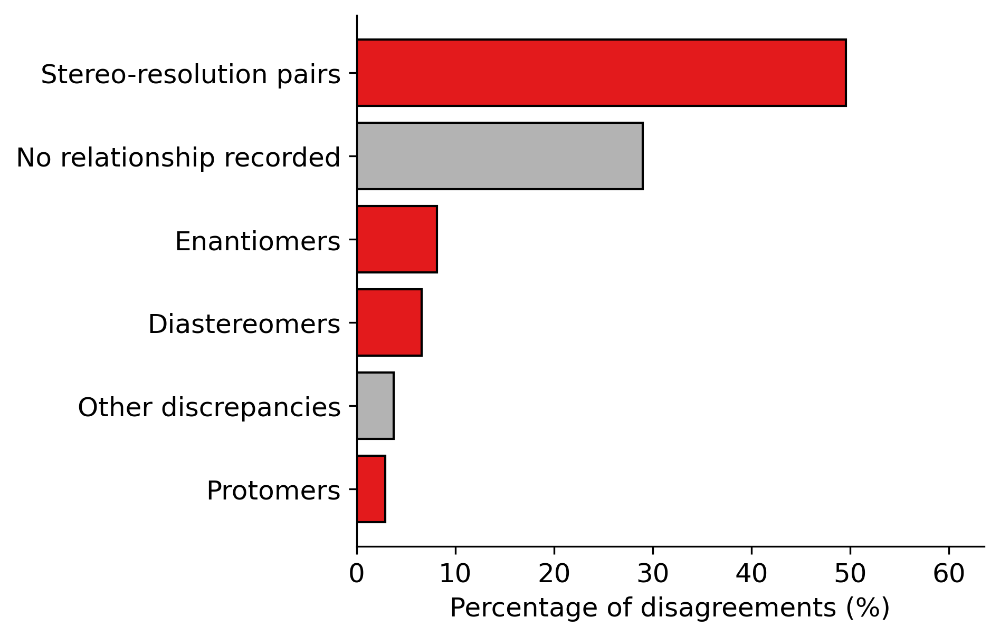

In [102]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------
# Data
# ------------------------

replacements = {
    "Unclassified": "Other discrepancies",
    "No StereoMapper relationship recorded": "No relationship recorded",
    "Unresolved (Possible Pipeline Error)": "Unresolved",
}

reason_summary_all = (
    disagreement_df["classification"]
    .fillna("No StereoMapper relationship recorded")
    .astype(str)
    .str.strip()
    .replace(replacements)
    .value_counts()
    .rename_axis("classification")
    .reset_index(name="n")
)

reason_summary_all["percentage_of_disagreements"] = (
    100 * reason_summary_all["n"] / len(disagreement_df)
)

reason_summary_all = reason_summary_all.sort_values(
    "percentage_of_disagreements",
    ascending=True
)

# ------------------------
# Colours
# ------------------------

main_colour = "#e31a1c"   # same red used for disagreement in panel A
special_colour = "#b3b3b3"  # grey for no recorded relationship

colours = [
    special_colour if cls == "No relationship recorded" or cls == "Other discrepancies" else main_colour
    for cls in reason_summary_all["classification"]
]

# ------------------------
# Plot settings
# ------------------------

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "font.size": 12,
    "figure.dpi": 300,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

fig, ax = plt.subplots(figsize=(6.5, 4.2))

bars = ax.barh(
    reason_summary_all["classification"],
    reason_summary_all["percentage_of_disagreements"],
    color=colours,
    edgecolor="black",
    linewidth=1.0,
)

# Add labels
# for bar, (_, row) in zip(bars, reason_summary_all.iterrows()):
#     width = bar.get_width()
#     label = f"{width:.1f}%"

#     ax.text(
#         width + 0.8,
#         bar.get_y() + bar.get_height() / 2,
#         label,
#         va="center",
#         ha="left",
#         fontsize=10,
#     )

ax.set_xlabel("Percentage of disagreements (%)")
ax.set_ylabel("")
ax.set_xlim(0, reason_summary_all["percentage_of_disagreements"].max() + 14)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.subplots_adjust(left=0.34, right=0.95, top=0.95, bottom=0.15)

plt.show()

out_base = Path.home() / "stereomapper_revision" / "v5" / "graphics" / "bridgedb_res" / "panelB"
fig.savefig(out_base.with_suffix(".svg"), bbox_inches="tight")
fig.savefig(out_base.with_suffix(".pdf"), bbox_inches="tight")

In [85]:
# now we need examples to show reasons for diffs use maybe 2 examples or 3?
# one for enantiomers, one for stereo-res? and then one for no relationship recorded?

stereo_res_examples_df = disagreement_df[
    disagreement_df["classification"] == "Stereo-resolution pairs"
]

enantiomer_examples_df = disagreement_df[
    disagreement_df["classification"] == "Enantiomers"
]

no_rel_recorded_df = disagreement_df[
    disagreement_df["classification"].isna()
]

In [87]:
# pick an example at random from each category
stereo_res_example = stereo_res_examples_df.sample(1, random_state=42).iloc[0]
enantiomer_example = enantiomer_examples_df.sample(1, random_state=42).iloc[0]
no_rel_recorded_example = no_rel_recorded_df.sample(1, random_state=42).iloc[0]

In [89]:
stereo_res_example

chebi_id                                         CHEBI:63579
hmdb_id                                          HMDB0006245
chebi_cluster_id                                      9303.0
hmdb_cluster_id                                       9305.0
comparison_outcome           disagreement_different_clusters
chebi_cluster_size                                       2.0
hmdb_cluster_size                                        2.0
cluster_pair_key                                (9303, 9305)
cluster_a                                             9303.0
cluster_b                                             9305.0
cluster_a_members        ["chebi:63579", "hmdb:HMDB0062302"]
cluster_b_members        ["chebi:91132", "hmdb:HMDB0006245"]
classification                       Stereo-resolution pairs
classification_status     Recorded StereoMapper relationship
Name: 805, dtype: object

In [90]:
enantiomer_example

chebi_id                                        CHEBI:88997
hmdb_id                                         HMDB0010432
chebi_cluster_id                                     3645.0
hmdb_cluster_id                                      3646.0
comparison_outcome          disagreement_different_clusters
chebi_cluster_size                                      1.0
hmdb_cluster_size                                       1.0
cluster_pair_key                               (3645, 3646)
cluster_a                                            3645.0
cluster_b                                            3646.0
cluster_a_members                           ["chebi:88997"]
cluster_b_members                      ["hmdb:HMDB0010432"]
classification                                  Enantiomers
classification_status    Recorded StereoMapper relationship
Name: 1323, dtype: object

In [92]:
# enantiomer example is too complex to show visually, lets grab another random example from enantiomers
enantiomer_example = enantiomer_examples_df.sample(1, random_state=35).iloc[0]
enantiomer_example

chebi_id                                           CHEBI:4470
hmdb_id                                           HMDB0001920
chebi_cluster_id                                       7270.0
hmdb_cluster_id                                        7269.0
comparison_outcome            disagreement_different_clusters
chebi_cluster_size                                        1.0
hmdb_cluster_size                                         2.0
cluster_pair_key                                 (7269, 7270)
cluster_a                                              7269.0
cluster_b                                              7270.0
cluster_a_members        ["chebi:146176", "hmdb:HMDB0001920"]
cluster_b_members                              ["chebi:4470"]
classification                                    Enantiomers
classification_status      Recorded StereoMapper relationship
Name: 664, dtype: object

In [88]:
no_rel_recorded_example

chebi_id                                           CHEBI:17897
hmdb_id                                            HMDB0010207
chebi_cluster_id                                       10181.0
hmdb_cluster_id                                         1500.0
comparison_outcome             disagreement_different_clusters
chebi_cluster_size                                         1.0
hmdb_cluster_size                                          1.0
cluster_pair_key                                 (1500, 10181)
cluster_a                                                  NaN
cluster_b                                                  NaN
cluster_a_members                                          NaN
cluster_b_members                                          NaN
classification                                             NaN
classification_status    No StereoMapper relationship assigned
Name: 294, dtype: object

In [99]:
# create visualisations of all examples for use in figure, svg format only
stereo_res_chebi_path = chebi_strucs_path / f"{stereo_res_example['chebi_id'].replace('CHEBI:', 'CHEBI_')}.sdf"
stereo_res_hmdb_path = hmdb_structures / f"{stereo_res_example['hmdb_id']}.sdf"

stereo_res_path = "/home/jackmcgoldrick/stereomapper_revision/v5/graphics/bridgedb_res/structures/stereo_res"

# now plot
structure_to_publication_svg(
    stereo_res_chebi_path,
    output_svg=f"{stereo_res_path}/stereo_res_chebi.svg",
    width=700,
    height=500,
    line_width=2.2,
    fixed_bond_length=38,
    font_size=1.0,
    transparent_background=True,)

structure_to_publication_svg(
    stereo_res_hmdb_path,
    output_svg=f"{stereo_res_path}/stereo_res_hmdb.svg",
    width=700,
    height=500,
    line_width=2.2,
    fixed_bond_length=38,
    font_size=1.0,
    transparent_background=True,)

"<?xml version='1.0' encoding='iso-8859-1'?>\n<svg version='1.1' baseProfile='full'\n              xmlns='http://www.w3.org/2000/svg'\n                      xmlns:rdkit='http://www.rdkit.org/xml'\n                      xmlns:xlink='http://www.w3.org/1999/xlink'\n                  xml:space='preserve'\nwidth='700px' height='500px' viewBox='0 0 700 500'>\n<!-- END OF HEADER -->\n<path class='bond-0 atom-0 atom-1' d='M 377.2,167.0 L 377.2,198.4' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-1 atom-1 atom-2' d='M 377.2,198.4 L 404.3,214.0' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-2 atom-2 atom-3' d='M 404.3,214.0 L 404.3,245.4' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-3 

In [100]:
# now same for enantiomers
enantiomer_chebi_path = chebi_strucs_path / f"{enantiomer_example['chebi_id'].replace('CHEBI:', 'CHEBI_')}.sdf"
enantiomer_hmdb_path = hmdb_structures / f"{enantiomer_example['hmdb_id']}.sdf"

enantiomer_path = "/home/jackmcgoldrick/stereomapper_revision/v5/graphics/bridgedb_res/structures/enantiomer"

structure_to_publication_svg(
    enantiomer_chebi_path,
    output_svg=f"{enantiomer_path}/enantiomer_chebi.svg",
    width=700,
    height=500,
    line_width=2.2,
    fixed_bond_length=38,
    font_size=1.0,
    transparent_background=True,)

structure_to_publication_svg(
    enantiomer_hmdb_path,
    output_svg=f"{enantiomer_path}/enantiomer_hmdb.svg",
    width=700,
    height=500,
    line_width=2.2,
    fixed_bond_length=38,
    font_size=1.0,
    transparent_background=True,)

"<?xml version='1.0' encoding='iso-8859-1'?>\n<svg version='1.1' baseProfile='full'\n              xmlns='http://www.w3.org/2000/svg'\n                      xmlns:rdkit='http://www.rdkit.org/xml'\n                      xmlns:xlink='http://www.w3.org/1999/xlink'\n                  xml:space='preserve'\nwidth='700px' height='500px' viewBox='0 0 700 500'>\n<!-- END OF HEADER -->\n<path class='bond-0 atom-10 atom-0' d='M 363.6,222.1 L 363.6,190.8' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-0 atom-10 atom-0' d='M 357.8,218.8 L 357.8,194.2' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-1 atom-1 atom-0' d='M 336.5,175.4 L 363.6,190.8' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-

In [101]:
# finally the no relationship recorded example
no_rel_chebi_path = chebi_strucs_path / f"{no_rel_recorded_example['chebi_id'].replace('CHEBI:', 'CHEBI_')}.sdf"
no_rel_hmdb_path = hmdb_structures / f"{no_rel_recorded_example['hmdb_id']}.sdf"

no_rel_path = "/home/jackmcgoldrick/stereomapper_revision/v5/graphics/bridgedb_res/structures/no_relationship_recorded"

structure_to_publication_svg(
    no_rel_chebi_path,
    output_svg=f"{no_rel_path}/no_rel_chebi.svg",
    width=700,
    height=500,
    line_width=2.2,
    fixed_bond_length=38,
    font_size=1.0,
    transparent_background=True,)

structure_to_publication_svg(
    no_rel_hmdb_path,
    output_svg=f"{no_rel_path}/no_rel_hmdb.svg",
    width=700,
    height=500,
    line_width=2.2,
    fixed_bond_length=38,
    font_size=1.0,
    transparent_background=True,)   

"<?xml version='1.0' encoding='iso-8859-1'?>\n<svg version='1.1' baseProfile='full'\n              xmlns='http://www.w3.org/2000/svg'\n                      xmlns:rdkit='http://www.rdkit.org/xml'\n                      xmlns:xlink='http://www.w3.org/1999/xlink'\n                  xml:space='preserve'\nwidth='700px' height='500px' viewBox='0 0 700 500'>\n<!-- END OF HEADER -->\n<path class='bond-0 atom-0 atom-1' d='M 382.0,216.1 L 390.6,221.1' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-0 atom-0 atom-1' d='M 390.6,221.1 L 399.2,226.0' style='fill:none;fill-rule:evenodd;stroke:#FF0000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-1 atom-7 atom-8' d='M 303.8,231.4 L 313.4,261.2' style='fill:none;fill-rule:evenodd;stroke:#000000;stroke-width:2.2px;stroke-linecap:butt;stroke-linejoin:miter;stroke-opacity:1' />\n<path class='bond-2 